In [1]:
import os
import json
import math
import numpy as np 
import pandas as pd

import matplotlib.pyplot as plt
%matplotlib inline 
from IPython.display import set_matplotlib_formats
set_matplotlib_formats('svg', 'pdf') 
from matplotlib.colors import to_rgb
import matplotlib
matplotlib.rcParams['lines.linewidth'] = 2.0
import seaborn as sns
sns.reset_orig()
sns.set()

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.utils.data as data
import torch.optim as optim

import torchvision
from torchvision.datasets import FashionMNIST
from torchvision import transforms

import os

device = torch.device("cuda")


C:\Users\-\AppData\Local\Temp\ipykernel_12892\208154953.py:10: DeprecationWarning: `set_matplotlib_formats` is deprecated since IPython 7.23, directly use `matplotlib_inline.backend_inline.set_matplotlib_formats()`
  set_matplotlib_formats('svg', 'pdf')


# data preprocessing

In [2]:
transform = transforms.Compose(
    [
     transforms.RandomHorizontalFlip(),
     transforms.ToTensor(),
     transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
    ]
     )


batch_size = 32
dataset = torchvision.datasets.ImageFolder(str(os.getcwd())+"\myData\\", transform=transform)

train_dataset,test_set = torch.utils.data.random_split(dataset, [0.8,0.2]) 
trainloader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size,
                                          shuffle=True, num_workers=2)
testloader = torch.utils.data.DataLoader(test_set, batch_size=batch_size,
                                         shuffle=False, num_workers=2)

train_loader = data.DataLoader(train_dataset, batch_size=128, shuffle=True, drop_last=True, pin_memory=True, num_workers=2)
test_loader = data.DataLoader(test_set, batch_size=128, shuffle=False, drop_last=False, num_workers=2)

# GAN model

In [3]:
class Generator(nn.Module):
    def __init__(self, latent_dim):
        super(Generator, self).__init__()
        self.latent_dim = latent_dim
        self.linear1 = nn.Linear(latent_dim, 512)  
        self.main = nn.Sequential(
            nn.ConvTranspose2d(512, 256, 4, 1, 0, bias=False),
            nn.BatchNorm2d(256),
            nn.ReLU(True),
            nn.ConvTranspose2d(256, 128, 4, 2, 1, bias=False),
            nn.BatchNorm2d(128),
            nn.ReLU(True),
            nn.ConvTranspose2d(128, 64, 4, 2, 1, bias=False),
            nn.BatchNorm2d(64),
            nn.ReLU(True),
            nn.ConvTranspose2d(64, 3, 4, 2, 1, bias=False),
            nn.Tanh()
        )

    def forward(self, input):       
        b_size = input.size(0)
        output = self.linear1(input.view(b_size, self.latent_dim))        
        #output = self.linear1(input)
        output = output.view(output.size(0), 512, 1, 1)  
        output = self.main(output)
        return output


class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            nn.Conv2d(3, 64, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 128, 4, 2, 1, bias=False),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(128, 256, 4, 2, 1, bias=False),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(256, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        output = self.main(input)
        return output.view(-1, 1).squeeze(1)

# parameters

In [4]:
# Models
latent_dim = 32
generator = Generator(latent_dim)
discriminator = Discriminator()

if torch.cuda.is_available(): 
    torch.cuda.manual_seed(42)
    torch.cuda.manual_seed_all(42)
    generator.to(device)
    discriminator.to(device)

# Optimizers
generator_optimizer = torch.optim.Adam(generator.parameters(), lr=0.001)
generator_scheduler = optim.lr_scheduler.ExponentialLR(optimizer=generator_optimizer, gamma=0.99)

discriminator_optimizer = torch.optim.Adam(discriminator.parameters(), lr=0.001)
discriminator_scheduler = optim.lr_scheduler.ExponentialLR(optimizer=discriminator_optimizer, gamma=0.99)

# loss
criterion = nn.BCELoss()

In [5]:
fixed_noise = torch.randn(16, latent_dim,1,1).to(device)

# training

Epoch: 0, discrimiantor fake error: 0.0443, discriminator real acc: 0.958


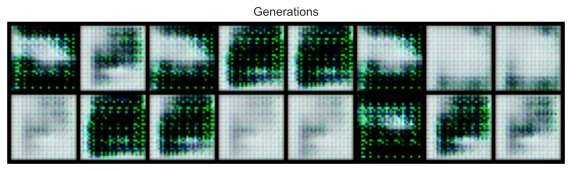

Epoch: 1, discrimiantor fake error: 0.0251, discriminator real acc: 0.973
Epoch: 2, discrimiantor fake error: 0.033, discriminator real acc: 0.965
Epoch: 3, discrimiantor fake error: 0.039, discriminator real acc: 0.959
Epoch: 4, discrimiantor fake error: 0.0317, discriminator real acc: 0.967
Epoch: 5, discrimiantor fake error: 0.0334, discriminator real acc: 0.966
Epoch: 6, discrimiantor fake error: 0.0333, discriminator real acc: 0.966
Epoch: 7, discrimiantor fake error: 0.0325, discriminator real acc: 0.968
Epoch: 8, discrimiantor fake error: 0.0352, discriminator real acc: 0.964
Epoch: 9, discrimiantor fake error: 0.034, discriminator real acc: 0.966
Epoch: 10, discrimiantor fake error: 0.0409, discriminator real acc: 0.958


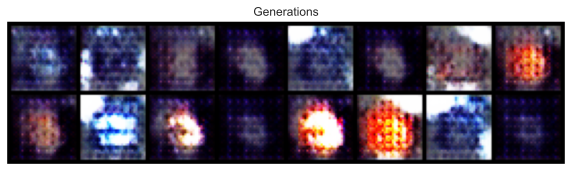

Epoch: 11, discrimiantor fake error: 0.0448, discriminator real acc: 0.955
Epoch: 12, discrimiantor fake error: 0.0478, discriminator real acc: 0.952
Epoch: 13, discrimiantor fake error: 0.0452, discriminator real acc: 0.954
Epoch: 14, discrimiantor fake error: 0.0487, discriminator real acc: 0.952
Epoch: 15, discrimiantor fake error: 0.0479, discriminator real acc: 0.951
Epoch: 16, discrimiantor fake error: 0.0471, discriminator real acc: 0.952
Epoch: 17, discrimiantor fake error: 0.0379, discriminator real acc: 0.962
Epoch: 18, discrimiantor fake error: 0.0398, discriminator real acc: 0.96
Epoch: 19, discrimiantor fake error: 0.0437, discriminator real acc: 0.956
Epoch: 20, discrimiantor fake error: 0.0363, discriminator real acc: 0.963


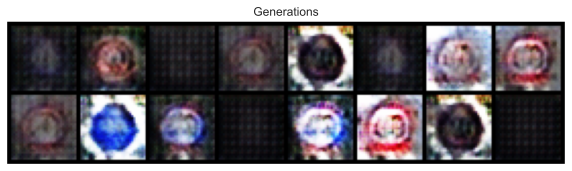

Epoch: 21, discrimiantor fake error: 0.036, discriminator real acc: 0.963
Epoch: 22, discrimiantor fake error: 0.0274, discriminator real acc: 0.972
Epoch: 23, discrimiantor fake error: 0.0277, discriminator real acc: 0.972
Epoch: 24, discrimiantor fake error: 0.0247, discriminator real acc: 0.975
Epoch: 25, discrimiantor fake error: 0.0203, discriminator real acc: 0.98
Epoch: 26, discrimiantor fake error: 0.0242, discriminator real acc: 0.975
Epoch: 27, discrimiantor fake error: 0.0219, discriminator real acc: 0.978
Epoch: 28, discrimiantor fake error: 0.0233, discriminator real acc: 0.976
Epoch: 29, discrimiantor fake error: 0.0163, discriminator real acc: 0.983
Epoch: 30, discrimiantor fake error: 0.0199, discriminator real acc: 0.98


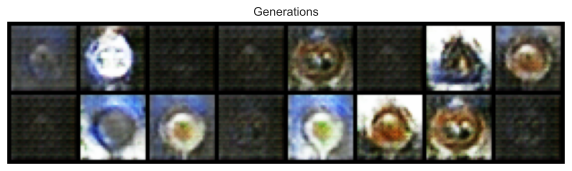

Epoch: 31, discrimiantor fake error: 0.0189, discriminator real acc: 0.98
Epoch: 32, discrimiantor fake error: 0.0122, discriminator real acc: 0.988
Epoch: 33, discrimiantor fake error: 0.0134, discriminator real acc: 0.986
Epoch: 34, discrimiantor fake error: 0.0154, discriminator real acc: 0.984
Epoch: 35, discrimiantor fake error: 0.0171, discriminator real acc: 0.982
Epoch: 36, discrimiantor fake error: 0.0107, discriminator real acc: 0.989
Epoch: 37, discrimiantor fake error: 0.0101, discriminator real acc: 0.99
Epoch: 38, discrimiantor fake error: 0.01, discriminator real acc: 0.99
Epoch: 39, discrimiantor fake error: 0.0102, discriminator real acc: 0.989
Epoch: 40, discrimiantor fake error: 0.00925, discriminator real acc: 0.991


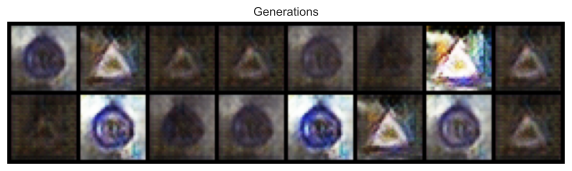

Epoch: 41, discrimiantor fake error: 0.00851, discriminator real acc: 0.991
Epoch: 42, discrimiantor fake error: 0.00758, discriminator real acc: 0.992
Epoch: 43, discrimiantor fake error: 0.0042, discriminator real acc: 0.996
Epoch: 44, discrimiantor fake error: 0.0054, discriminator real acc: 0.994
Epoch: 45, discrimiantor fake error: 0.00612, discriminator real acc: 0.994
Epoch: 46, discrimiantor fake error: 0.00639, discriminator real acc: 0.993
Epoch: 47, discrimiantor fake error: 0.00697, discriminator real acc: 0.993
Epoch: 48, discrimiantor fake error: 0.0061, discriminator real acc: 0.994
Epoch: 49, discrimiantor fake error: 0.00588, discriminator real acc: 0.994
Epoch: 50, discrimiantor fake error: 0.00661, discriminator real acc: 0.994


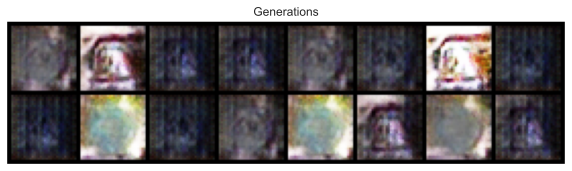

Epoch: 51, discrimiantor fake error: 0.00475, discriminator real acc: 0.995
Epoch: 52, discrimiantor fake error: 0.00704, discriminator real acc: 0.993
Epoch: 53, discrimiantor fake error: 0.00586, discriminator real acc: 0.994
Epoch: 54, discrimiantor fake error: 0.00865, discriminator real acc: 0.992
Epoch: 55, discrimiantor fake error: 0.00455, discriminator real acc: 0.995
Epoch: 56, discrimiantor fake error: 0.00885, discriminator real acc: 0.991
Epoch: 57, discrimiantor fake error: 0.00672, discriminator real acc: 0.993
Epoch: 58, discrimiantor fake error: 0.00551, discriminator real acc: 0.995
Epoch: 59, discrimiantor fake error: 0.00483, discriminator real acc: 0.995
Epoch: 60, discrimiantor fake error: 0.00584, discriminator real acc: 0.995


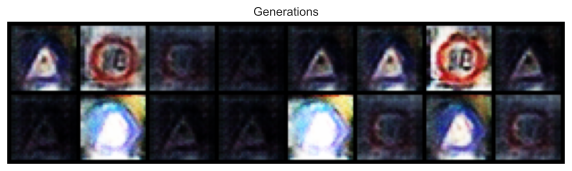

Epoch: 61, discrimiantor fake error: 0.0061, discriminator real acc: 0.994
Epoch: 62, discrimiantor fake error: 0.00715, discriminator real acc: 0.993
Epoch: 63, discrimiantor fake error: 0.00775, discriminator real acc: 0.992
Epoch: 64, discrimiantor fake error: 0.00959, discriminator real acc: 0.99
Epoch: 65, discrimiantor fake error: 0.00872, discriminator real acc: 0.991
Epoch: 66, discrimiantor fake error: 0.00837, discriminator real acc: 0.991
Epoch: 67, discrimiantor fake error: 0.00877, discriminator real acc: 0.992
Epoch: 68, discrimiantor fake error: 0.00759, discriminator real acc: 0.991
Epoch: 69, discrimiantor fake error: 1.97e-16, discriminator real acc: 1.0
Epoch: 70, discrimiantor fake error: 0.00148, discriminator real acc: 0.999


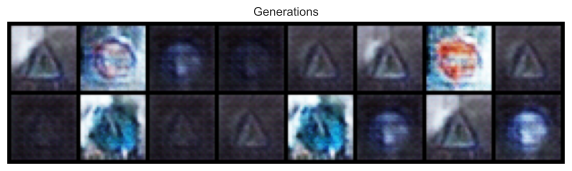

Epoch: 71, discrimiantor fake error: 0.00918, discriminator real acc: 0.991
Epoch: 72, discrimiantor fake error: 0.0107, discriminator real acc: 0.989
Epoch: 73, discrimiantor fake error: 0.00958, discriminator real acc: 0.991
Epoch: 74, discrimiantor fake error: 0.007, discriminator real acc: 0.993
Epoch: 75, discrimiantor fake error: 0.0051, discriminator real acc: 0.995
Epoch: 76, discrimiantor fake error: 0.0073, discriminator real acc: 0.993
Epoch: 77, discrimiantor fake error: 0.0053, discriminator real acc: 0.995
Epoch: 78, discrimiantor fake error: 0.00427, discriminator real acc: 0.996
Epoch: 79, discrimiantor fake error: 0.00629, discriminator real acc: 0.994
Epoch: 80, discrimiantor fake error: 0.00534, discriminator real acc: 0.994


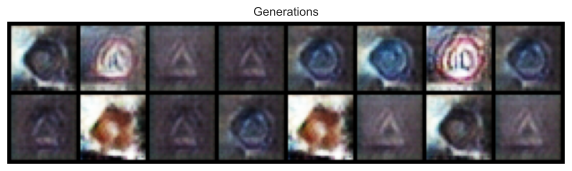

Epoch: 81, discrimiantor fake error: 0.0133, discriminator real acc: 0.987
Epoch: 82, discrimiantor fake error: 0.0112, discriminator real acc: 0.989
Epoch: 83, discrimiantor fake error: 0.00918, discriminator real acc: 0.991
Epoch: 84, discrimiantor fake error: 0.0132, discriminator real acc: 0.986
Epoch: 85, discrimiantor fake error: 0.0105, discriminator real acc: 0.99
Epoch: 86, discrimiantor fake error: 0.0125, discriminator real acc: 0.987
Epoch: 87, discrimiantor fake error: 0.0114, discriminator real acc: 0.989
Epoch: 88, discrimiantor fake error: 0.00718, discriminator real acc: 0.993
Epoch: 89, discrimiantor fake error: 0.0098, discriminator real acc: 0.99
Epoch: 90, discrimiantor fake error: 0.0114, discriminator real acc: 0.988


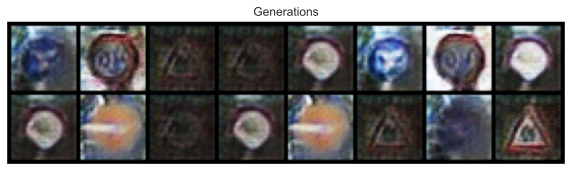

Epoch: 91, discrimiantor fake error: 0.0125, discriminator real acc: 0.987
Epoch: 92, discrimiantor fake error: 0.00895, discriminator real acc: 0.991
Epoch: 93, discrimiantor fake error: 0.00778, discriminator real acc: 0.992
Epoch: 94, discrimiantor fake error: 0.00863, discriminator real acc: 0.991
Epoch: 95, discrimiantor fake error: 0.00502, discriminator real acc: 0.995
Epoch: 96, discrimiantor fake error: 0.00933, discriminator real acc: 0.99
Epoch: 97, discrimiantor fake error: 0.00714, discriminator real acc: 0.993
Epoch: 98, discrimiantor fake error: 0.00881, discriminator real acc: 0.991
Epoch: 99, discrimiantor fake error: 0.00836, discriminator real acc: 0.992
Epoch: 100, discrimiantor fake error: 0.00659, discriminator real acc: 0.993


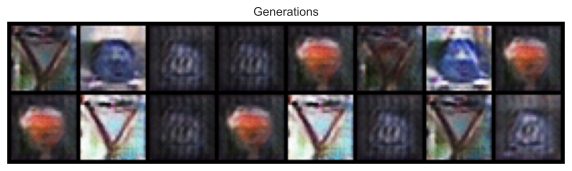

Epoch: 101, discrimiantor fake error: 0.00695, discriminator real acc: 0.993
Epoch: 102, discrimiantor fake error: 0.00881, discriminator real acc: 0.991
Epoch: 103, discrimiantor fake error: 0.00856, discriminator real acc: 0.991
Epoch: 104, discrimiantor fake error: 0.00976, discriminator real acc: 0.991
Epoch: 105, discrimiantor fake error: 0.00915, discriminator real acc: 0.99
Epoch: 106, discrimiantor fake error: 0.00958, discriminator real acc: 0.99
Epoch: 107, discrimiantor fake error: 0.00882, discriminator real acc: 0.991
Epoch: 108, discrimiantor fake error: 0.00611, discriminator real acc: 0.994
Epoch: 109, discrimiantor fake error: 0.00526, discriminator real acc: 0.995
Epoch: 110, discrimiantor fake error: 0.00809, discriminator real acc: 0.991


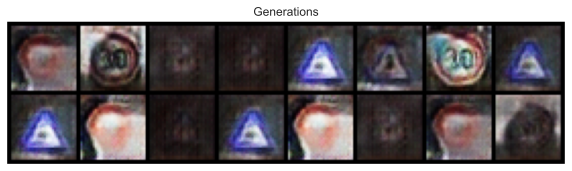

Epoch: 111, discrimiantor fake error: 0.00806, discriminator real acc: 0.993
Epoch: 112, discrimiantor fake error: 0.00706, discriminator real acc: 0.993
Epoch: 113, discrimiantor fake error: 0.0106, discriminator real acc: 0.99
Epoch: 114, discrimiantor fake error: 0.00824, discriminator real acc: 0.992
Epoch: 115, discrimiantor fake error: 0.00739, discriminator real acc: 0.993
Epoch: 116, discrimiantor fake error: 0.00607, discriminator real acc: 0.994
Epoch: 117, discrimiantor fake error: 0.00653, discriminator real acc: 0.993
Epoch: 118, discrimiantor fake error: 0.00501, discriminator real acc: 0.995
Epoch: 119, discrimiantor fake error: 0.00429, discriminator real acc: 0.996
Epoch: 120, discrimiantor fake error: 0.0059, discriminator real acc: 0.994


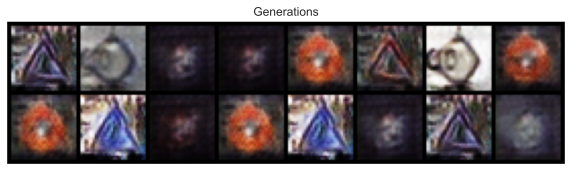

Epoch: 121, discrimiantor fake error: 0.00459, discriminator real acc: 0.995
Epoch: 122, discrimiantor fake error: 0.00428, discriminator real acc: 0.996
Epoch: 123, discrimiantor fake error: 0.00496, discriminator real acc: 0.995
Epoch: 124, discrimiantor fake error: 0.00652, discriminator real acc: 0.993
Epoch: 125, discrimiantor fake error: 0.00567, discriminator real acc: 0.994
Epoch: 126, discrimiantor fake error: 0.00611, discriminator real acc: 0.994
Epoch: 127, discrimiantor fake error: 0.00396, discriminator real acc: 0.996
Epoch: 128, discrimiantor fake error: 0.0049, discriminator real acc: 0.995
Epoch: 129, discrimiantor fake error: 0.0039, discriminator real acc: 0.996
Epoch: 130, discrimiantor fake error: 0.00242, discriminator real acc: 0.998


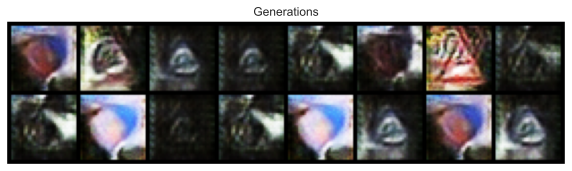

Epoch: 131, discrimiantor fake error: 0.00442, discriminator real acc: 0.996
Epoch: 132, discrimiantor fake error: 0.0063, discriminator real acc: 0.994
Epoch: 133, discrimiantor fake error: 0.00938, discriminator real acc: 0.991
Epoch: 134, discrimiantor fake error: 0.00975, discriminator real acc: 0.99
Epoch: 135, discrimiantor fake error: 0.0108, discriminator real acc: 0.989
Epoch: 136, discrimiantor fake error: 0.0088, discriminator real acc: 0.991
Epoch: 137, discrimiantor fake error: 0.00638, discriminator real acc: 0.994
Epoch: 138, discrimiantor fake error: 0.00586, discriminator real acc: 0.994
Epoch: 139, discrimiantor fake error: 0.0043, discriminator real acc: 0.996
Epoch: 140, discrimiantor fake error: 0.0043, discriminator real acc: 0.996


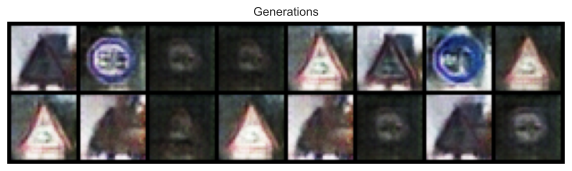

Epoch: 141, discrimiantor fake error: 0.00572, discriminator real acc: 0.994
Epoch: 142, discrimiantor fake error: 0.00628, discriminator real acc: 0.993
Epoch: 143, discrimiantor fake error: 0.00515, discriminator real acc: 0.995
Epoch: 144, discrimiantor fake error: 0.00485, discriminator real acc: 0.995
Epoch: 145, discrimiantor fake error: 0.00452, discriminator real acc: 0.995
Epoch: 146, discrimiantor fake error: 0.00436, discriminator real acc: 0.996
Epoch: 147, discrimiantor fake error: 0.00467, discriminator real acc: 0.995
Epoch: 148, discrimiantor fake error: 0.00547, discriminator real acc: 0.995
Epoch: 149, discrimiantor fake error: 0.00492, discriminator real acc: 0.995
Epoch: 150, discrimiantor fake error: 0.00525, discriminator real acc: 0.995


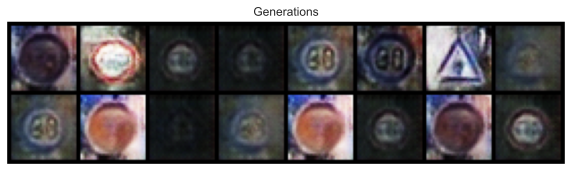

Epoch: 151, discrimiantor fake error: 0.00654, discriminator real acc: 0.994
Epoch: 152, discrimiantor fake error: 0.00579, discriminator real acc: 0.994
Epoch: 153, discrimiantor fake error: 0.00622, discriminator real acc: 0.994
Epoch: 154, discrimiantor fake error: 0.00758, discriminator real acc: 0.992
Epoch: 155, discrimiantor fake error: 0.00478, discriminator real acc: 0.995
Epoch: 156, discrimiantor fake error: 0.00808, discriminator real acc: 0.992
Epoch: 157, discrimiantor fake error: 0.00952, discriminator real acc: 0.991
Epoch: 158, discrimiantor fake error: 0.00862, discriminator real acc: 0.992
Epoch: 159, discrimiantor fake error: 0.00941, discriminator real acc: 0.99
Epoch: 160, discrimiantor fake error: 0.00738, discriminator real acc: 0.993


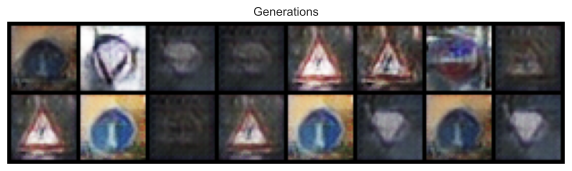

Epoch: 161, discrimiantor fake error: 0.00719, discriminator real acc: 0.993
Epoch: 162, discrimiantor fake error: 0.00817, discriminator real acc: 0.992
Epoch: 163, discrimiantor fake error: 0.00844, discriminator real acc: 0.992
Epoch: 164, discrimiantor fake error: 0.00729, discriminator real acc: 0.993
Epoch: 165, discrimiantor fake error: 0.00602, discriminator real acc: 0.994
Epoch: 166, discrimiantor fake error: 0.00658, discriminator real acc: 0.994
Epoch: 167, discrimiantor fake error: 0.00499, discriminator real acc: 0.995
Epoch: 168, discrimiantor fake error: 0.00628, discriminator real acc: 0.994
Epoch: 169, discrimiantor fake error: 0.00376, discriminator real acc: 0.996
Epoch: 170, discrimiantor fake error: 0.00504, discriminator real acc: 0.995


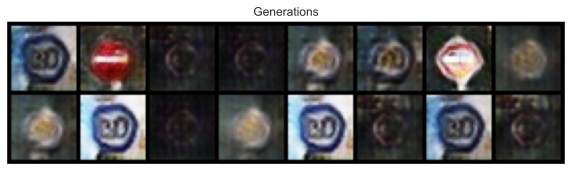

Epoch: 171, discrimiantor fake error: 0.0066, discriminator real acc: 0.993
Epoch: 172, discrimiantor fake error: 0.00648, discriminator real acc: 0.993
Epoch: 173, discrimiantor fake error: 0.00425, discriminator real acc: 0.996
Epoch: 174, discrimiantor fake error: 0.00606, discriminator real acc: 0.994
Epoch: 175, discrimiantor fake error: 0.00464, discriminator real acc: 0.995
Epoch: 176, discrimiantor fake error: 0.00502, discriminator real acc: 0.995
Epoch: 177, discrimiantor fake error: 0.00651, discriminator real acc: 0.994
Epoch: 178, discrimiantor fake error: 0.00476, discriminator real acc: 0.995
Epoch: 179, discrimiantor fake error: 0.00494, discriminator real acc: 0.995
Epoch: 180, discrimiantor fake error: 0.00625, discriminator real acc: 0.994


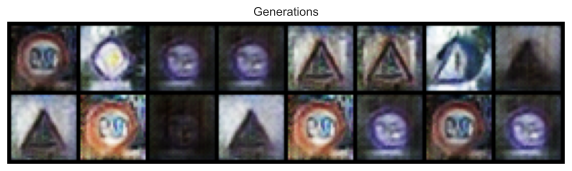

Epoch: 181, discrimiantor fake error: 0.00504, discriminator real acc: 0.995
Epoch: 182, discrimiantor fake error: 0.00513, discriminator real acc: 0.995
Epoch: 183, discrimiantor fake error: 0.00528, discriminator real acc: 0.995
Epoch: 184, discrimiantor fake error: 0.00989, discriminator real acc: 0.99
Epoch: 185, discrimiantor fake error: 0.00928, discriminator real acc: 0.991
Epoch: 186, discrimiantor fake error: 0.00776, discriminator real acc: 0.992
Epoch: 187, discrimiantor fake error: 0.00783, discriminator real acc: 0.992
Epoch: 188, discrimiantor fake error: 0.0082, discriminator real acc: 0.992
Epoch: 189, discrimiantor fake error: 0.00682, discriminator real acc: 0.993
Epoch: 190, discrimiantor fake error: 0.00682, discriminator real acc: 0.993


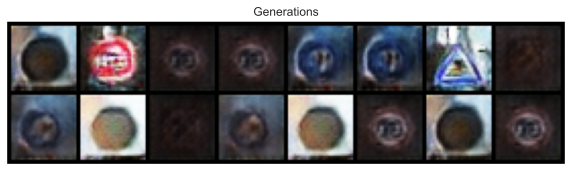

Epoch: 191, discrimiantor fake error: 0.00618, discriminator real acc: 0.994
Epoch: 192, discrimiantor fake error: 0.00696, discriminator real acc: 0.993
Epoch: 193, discrimiantor fake error: 0.00621, discriminator real acc: 0.994
Epoch: 194, discrimiantor fake error: 0.00616, discriminator real acc: 0.994
Epoch: 195, discrimiantor fake error: 0.00695, discriminator real acc: 0.993
Epoch: 196, discrimiantor fake error: 0.00658, discriminator real acc: 0.993
Epoch: 197, discrimiantor fake error: 0.00607, discriminator real acc: 0.994
Epoch: 198, discrimiantor fake error: 0.00669, discriminator real acc: 0.993
Epoch: 199, discrimiantor fake error: 0.00508, discriminator real acc: 0.995
Epoch: 200, discrimiantor fake error: 0.00471, discriminator real acc: 0.995


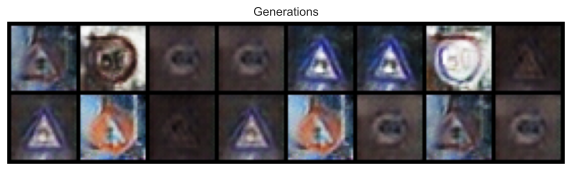

Epoch: 201, discrimiantor fake error: 0.00463, discriminator real acc: 0.995
Epoch: 202, discrimiantor fake error: 0.00489, discriminator real acc: 0.995
Epoch: 203, discrimiantor fake error: 0.00449, discriminator real acc: 0.995
Epoch: 204, discrimiantor fake error: 0.00555, discriminator real acc: 0.995
Epoch: 205, discrimiantor fake error: 0.00436, discriminator real acc: 0.996
Epoch: 206, discrimiantor fake error: 0.00422, discriminator real acc: 0.996
Epoch: 207, discrimiantor fake error: 0.00615, discriminator real acc: 0.994
Epoch: 208, discrimiantor fake error: 0.00586, discriminator real acc: 0.995
Epoch: 209, discrimiantor fake error: 0.0049, discriminator real acc: 0.995
Epoch: 210, discrimiantor fake error: 0.00917, discriminator real acc: 0.991


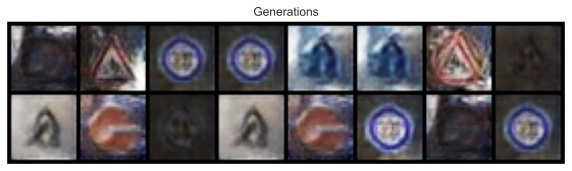

Epoch: 211, discrimiantor fake error: 0.00952, discriminator real acc: 0.99
Epoch: 212, discrimiantor fake error: 0.00817, discriminator real acc: 0.992
Epoch: 213, discrimiantor fake error: 0.00582, discriminator real acc: 0.993
Epoch: 214, discrimiantor fake error: 0.00504, discriminator real acc: 0.995
Epoch: 215, discrimiantor fake error: 0.0054, discriminator real acc: 0.995
Epoch: 216, discrimiantor fake error: 0.00649, discriminator real acc: 0.993
Epoch: 217, discrimiantor fake error: 0.00519, discriminator real acc: 0.995
Epoch: 218, discrimiantor fake error: 0.00657, discriminator real acc: 0.993
Epoch: 219, discrimiantor fake error: 0.0054, discriminator real acc: 0.995
Epoch: 220, discrimiantor fake error: 0.00422, discriminator real acc: 0.996


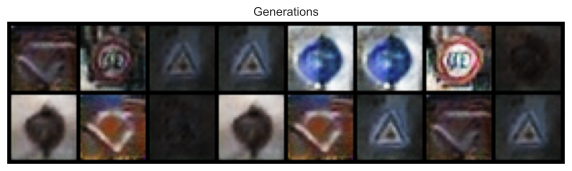

Epoch: 221, discrimiantor fake error: 0.00637, discriminator real acc: 0.993
Epoch: 222, discrimiantor fake error: 0.00557, discriminator real acc: 0.994
Epoch: 223, discrimiantor fake error: 0.0062, discriminator real acc: 0.994
Epoch: 224, discrimiantor fake error: 0.00497, discriminator real acc: 0.995
Epoch: 225, discrimiantor fake error: 0.00521, discriminator real acc: 0.995
Epoch: 226, discrimiantor fake error: 0.00634, discriminator real acc: 0.994
Epoch: 227, discrimiantor fake error: 0.00605, discriminator real acc: 0.994
Epoch: 228, discrimiantor fake error: 0.00608, discriminator real acc: 0.994
Epoch: 229, discrimiantor fake error: 0.00564, discriminator real acc: 0.994
Epoch: 230, discrimiantor fake error: 0.00644, discriminator real acc: 0.994


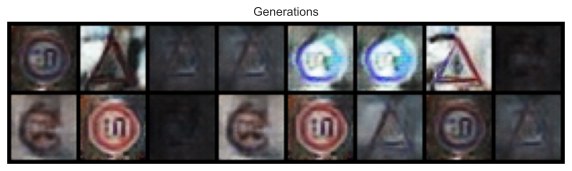

Epoch: 231, discrimiantor fake error: 0.00772, discriminator real acc: 0.992
Epoch: 232, discrimiantor fake error: 0.00607, discriminator real acc: 0.994
Epoch: 233, discrimiantor fake error: 0.00503, discriminator real acc: 0.995
Epoch: 234, discrimiantor fake error: 0.00557, discriminator real acc: 0.994
Epoch: 235, discrimiantor fake error: 0.00652, discriminator real acc: 0.993
Epoch: 236, discrimiantor fake error: 0.00705, discriminator real acc: 0.993
Epoch: 237, discrimiantor fake error: 0.00474, discriminator real acc: 0.996
Epoch: 238, discrimiantor fake error: 0.00479, discriminator real acc: 0.995
Epoch: 239, discrimiantor fake error: 0.00589, discriminator real acc: 0.994
Epoch: 240, discrimiantor fake error: 0.00477, discriminator real acc: 0.995


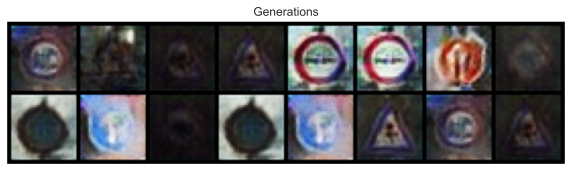

Epoch: 241, discrimiantor fake error: 0.00813, discriminator real acc: 0.992
Epoch: 242, discrimiantor fake error: 0.00764, discriminator real acc: 0.993
Epoch: 243, discrimiantor fake error: 0.0055, discriminator real acc: 0.995
Epoch: 244, discrimiantor fake error: 0.00588, discriminator real acc: 0.994
Epoch: 245, discrimiantor fake error: 0.00448, discriminator real acc: 0.995
Epoch: 246, discrimiantor fake error: 0.0061, discriminator real acc: 0.994
Epoch: 247, discrimiantor fake error: 0.00642, discriminator real acc: 0.993
Epoch: 248, discrimiantor fake error: 0.00589, discriminator real acc: 0.994
Epoch: 249, discrimiantor fake error: 0.00396, discriminator real acc: 0.996
Epoch: 250, discrimiantor fake error: 0.00475, discriminator real acc: 0.995


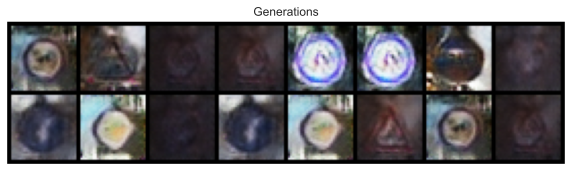

Epoch: 251, discrimiantor fake error: 0.00595, discriminator real acc: 0.994
Epoch: 252, discrimiantor fake error: 0.00464, discriminator real acc: 0.995
Epoch: 253, discrimiantor fake error: 0.00464, discriminator real acc: 0.995
Epoch: 254, discrimiantor fake error: 0.00425, discriminator real acc: 0.996
Epoch: 255, discrimiantor fake error: 0.00566, discriminator real acc: 0.994
Epoch: 256, discrimiantor fake error: 0.0042, discriminator real acc: 0.996
Epoch: 257, discrimiantor fake error: 0.00418, discriminator real acc: 0.996
Epoch: 258, discrimiantor fake error: 0.00556, discriminator real acc: 0.994
Epoch: 259, discrimiantor fake error: 0.00544, discriminator real acc: 0.995
Epoch: 260, discrimiantor fake error: 0.00423, discriminator real acc: 0.996


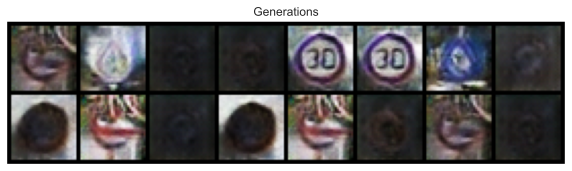

Epoch: 261, discrimiantor fake error: 0.0039, discriminator real acc: 0.996
Epoch: 262, discrimiantor fake error: 0.00524, discriminator real acc: 0.995
Epoch: 263, discrimiantor fake error: 0.00614, discriminator real acc: 0.994
Epoch: 264, discrimiantor fake error: 0.00752, discriminator real acc: 0.993
Epoch: 265, discrimiantor fake error: 0.00811, discriminator real acc: 0.992
Epoch: 266, discrimiantor fake error: 0.0104, discriminator real acc: 0.99
Epoch: 267, discrimiantor fake error: 0.00826, discriminator real acc: 0.992
Epoch: 268, discrimiantor fake error: 0.0108, discriminator real acc: 0.99
Epoch: 269, discrimiantor fake error: 0.01, discriminator real acc: 0.99
Epoch: 270, discrimiantor fake error: 0.00837, discriminator real acc: 0.992


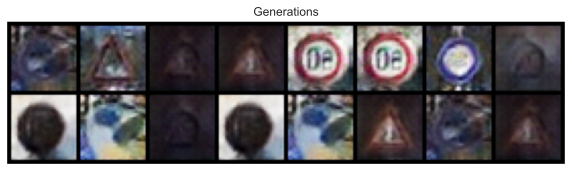

Epoch: 271, discrimiantor fake error: 0.00832, discriminator real acc: 0.992
Epoch: 272, discrimiantor fake error: 0.0082, discriminator real acc: 0.991
Epoch: 273, discrimiantor fake error: 0.00754, discriminator real acc: 0.993
Epoch: 274, discrimiantor fake error: 0.009, discriminator real acc: 0.991
Epoch: 275, discrimiantor fake error: 0.00635, discriminator real acc: 0.994
Epoch: 276, discrimiantor fake error: 0.00538, discriminator real acc: 0.995
Epoch: 277, discrimiantor fake error: 0.00569, discriminator real acc: 0.994
Epoch: 278, discrimiantor fake error: 0.00606, discriminator real acc: 0.994
Epoch: 279, discrimiantor fake error: 0.00552, discriminator real acc: 0.994
Epoch: 280, discrimiantor fake error: 0.00621, discriminator real acc: 0.994


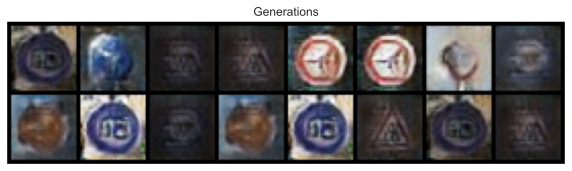

Epoch: 281, discrimiantor fake error: 0.00481, discriminator real acc: 0.995
Epoch: 282, discrimiantor fake error: 0.0056, discriminator real acc: 0.995
Epoch: 283, discrimiantor fake error: 0.00553, discriminator real acc: 0.994
Epoch: 284, discrimiantor fake error: 0.00529, discriminator real acc: 0.995
Epoch: 285, discrimiantor fake error: 0.00453, discriminator real acc: 0.995
Epoch: 286, discrimiantor fake error: 0.00528, discriminator real acc: 0.995
Epoch: 287, discrimiantor fake error: 0.00594, discriminator real acc: 0.994
Epoch: 288, discrimiantor fake error: 0.00482, discriminator real acc: 0.995
Epoch: 289, discrimiantor fake error: 0.00544, discriminator real acc: 0.995
Epoch: 290, discrimiantor fake error: 0.00544, discriminator real acc: 0.995


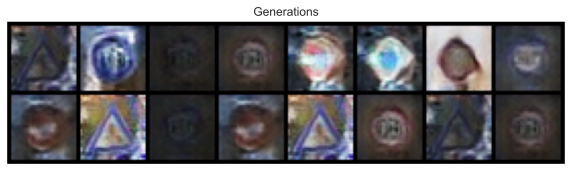

Epoch: 291, discrimiantor fake error: 0.00591, discriminator real acc: 0.994
Epoch: 292, discrimiantor fake error: 0.00604, discriminator real acc: 0.994
Epoch: 293, discrimiantor fake error: 0.00492, discriminator real acc: 0.995
Epoch: 294, discrimiantor fake error: 0.00605, discriminator real acc: 0.994
Epoch: 295, discrimiantor fake error: 0.00549, discriminator real acc: 0.995
Epoch: 296, discrimiantor fake error: 0.007, discriminator real acc: 0.993
Epoch: 297, discrimiantor fake error: 0.00656, discriminator real acc: 0.993
Epoch: 298, discrimiantor fake error: 0.00687, discriminator real acc: 0.993
Epoch: 299, discrimiantor fake error: 0.00645, discriminator real acc: 0.994
Epoch: 300, discrimiantor fake error: 0.00917, discriminator real acc: 0.991


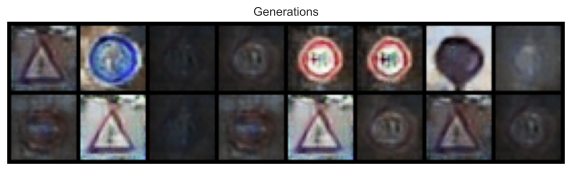

In [6]:
G_losses = []
D_losses = []
num_epochs = 301
for epoch in range(num_epochs):
    discriminator_fake_acc = []
    discriminator_real_acc = []
    for i, data in enumerate(train_loader, 0):
        discriminator_optimizer.zero_grad()
        real_images = data[0].to(device)
        b_size = real_images.size(0)
        label = torch.ones((b_size,), dtype=torch.float).to(device) # Setting labels for real images
        output = discriminator(real_images).view(-1)
        error_discriminator_real = criterion(output, label)
        discriminator_real_acc.append(output.mean().item())
        noise = torch.randn(b_size, latent_dim,1,1).to(device)
        fake_images = generator(noise).to(device)
        label_fake = torch.zeros((b_size,), dtype=torch.float).to(device)
        output = discriminator(fake_images.detach()).view(-1)
        error_discriminator_fake = criterion(output, label_fake)
        discriminator_fake_acc.append(output.mean().item())
        error_discriminator = error_discriminator_real + error_discriminator_fake
        error_discriminator.backward()
        discriminator_optimizer.step()

        generator_optimizer.zero_grad()
        label = torch.ones((b_size,), dtype=torch.float).to(device)  # fake labels are real for generator cost
        output = discriminator(fake_images).view(-1)
        error_generator = criterion(output, label)
        error_generator.backward()
        D_G_z2 = output.mean().item()
        generator_optimizer.step()

        G_losses.append(error_generator.item())
        D_losses.append(error_discriminator.item())

    print(f"Epoch: {epoch}, discrimiantor fake error: {np.mean(discriminator_fake_acc):.3}, discriminator real acc: {np.mean(discriminator_real_acc):.3}")
    generator_scheduler.step()
    discriminator_scheduler.step()
    if epoch % 10 == 0:
        with torch.no_grad():
            fake = generator(fixed_noise).detach().cpu()
        grid = torchvision.utils.make_grid(fake, normalize=True)
        grid = grid.permute(1, 2, 0)
        plt.figure(figsize=(10,10))
        plt.title(f"Generations")
        plt.imshow(grid)
        plt.axis('off')
        plt.show()

# generate new data

In [7]:
from torchvision.utils import save_image
from PIL import Image

random_noise = torch.randn(1000, latent_dim).to(device)
with torch.no_grad():
        generated_imgs = generator(random_noise).detach().cpu()

torch.save(generated_imgs,"generated_images.pt")
!mkdir  -p /content/ssne_4/output/images/
!mkdir  -p /content/ssne_4/output/real_images/
for i in range(len(generated_imgs)):
    img1 = generated_imgs[i]
    grid = torchvision.utils.make_grid(img1, normalize=True)
    grid = grid.permute(1, 2, 0)
    grid = grid.cpu().numpy() * 255
    grid = grid.astype(np.uint8)
    grid = Image.fromarray(grid)
    grid.save("/images/"+str(i)+".jpeg")

from torchvision.datasets import ImageFolder
from PIL import Image
import os
from torchvision.transforms import ToPILImage

The syntax of the command is incorrect.
The syntax of the command is incorrect.


FileNotFoundError: [Errno 2] No such file or directory: '/images/0.jpeg'